# 3) Dataset [10 points]

In [ ]:
# Import libraries
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from skimage import segmentation, color
from skimage.segmentation import quickshift

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/ECSE-415-project/"

Mounted at /content/drive


In [ ]:
# define paths for the different folders
rgb_path = os.path.join(path, "rgb")

mask_path = os.path.join(path, "mask")

csv_path = os.path.join(path, "csv")
train_subjects_path = os.path.join(path, "splits", "train_subjects.csv")
val_subjects_path = os.path.join(path, "splits", "validate subjects.csv")

Create a dictionary of subjects where:


*   The key is the combination of the first 4 strings of the filename
*   The value is a list containing all the name (except the extension) of the files that refers to the same subject



In [ ]:
def get_subject_id(filename):
  filename_splitted = filename.split("-")
  # We are interested in the first four part
  filename_splitted = filename_splitted[:3]
  separator = "-"
  subject_id = separator.join(filename_splitted)
  return subject_id

In [ ]:
subjects = {}

for filename in os.listdir(csv_path):
    f = os.path.join(csv_path, filename)
    # checking if it is a file
    if os.path.isfile(f):
      # get the subject id
      subject_id = get_subject_id(filename)
      # Get filename without extension
      filename_no_extension =  os.path.splitext(filename)[0]
      # Add it to the dict and append the filename with no extension
      subjects.setdefault(subject_id, []).append(filename_no_extension)

## 3.1) Plot for a sample subject
Plot three images for a sample subject - (i) an input image, (ii) the corresponding
mask, and (iii) overlay the periphery of the mask onto the image to draw bounding
boxes around different types of nuclei and label them. Sample output is shown in
Figure 1 [5 points]

In [ ]:
# Number of subjects
subjects_keys = list(subjects.keys())
N = len(subjects_keys)


# Select a random subject
subject_idx = np.random.randint(0, N)
subject_key = subjects_keys[subject_idx]

# Load the rgb
subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][0] + ".png")
print(subject_rgb_path)
subject_rgb = cv2.imread(subject_rgb_path)
subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)

# Load the mask
subject_mask_path = os.path.join(mask_path, subjects[subject_key][0] + ".png")
subject_mask = cv2.imread(subject_mask_path)
subject_mask = cv2.cvtColor(subject_mask, cv2.COLOR_BGR2RGB)
subject_mask_gray = cv2.cvtColor(subject_mask, cv2.COLOR_BGR2GRAY)



/content/drive/MyDrive/ECSE-415-project/rgb/TCGA-C8-A12V-DX1_id-5ea40b30ddda5f8398999de2_left-12069_top-58222_bottom-58561_right-12366.png


In [ ]:

def get_coordinates(coords_x, coords_y):
  coordinates = []
  for x, y in zip(coords_x, coords_y):
    # Convert the coordinates of the polyline into numpy
    x_p = np.fromstring(x, sep=",", dtype=np.int32)
    y_p = np.fromstring(y, sep=",", dtype=np.int32)
    # Stack it and reshape it to have [x, y] as element of array
    points = np.column_stack((x_p, y_p)).reshape(-1, 1, 2) # The third dimension is added only because opencv requires it
    coordinates.append(points)
  return coordinates

In [ ]:
def draw_polylines(image, coordinates):
  masked = image.copy()
  for coords in coordinates:
    # For each polyline draw it on the image
    masked = cv2.polylines(masked, [coords], True, (255, 0, 0), 1)
  return masked


In [ ]:
subject_csv_path = os.path.join(csv_path, subjects[subject_key][0] + ".csv")
df = pd.read_csv(subject_csv_path)
df.head()

coords_x = df["coords_x"].to_list()
coords_y = df["coords_y"].to_list()

coordinates = get_coordinates(coords_x, coords_y)
masked = draw_polylines(subject_rgb, coordinates)

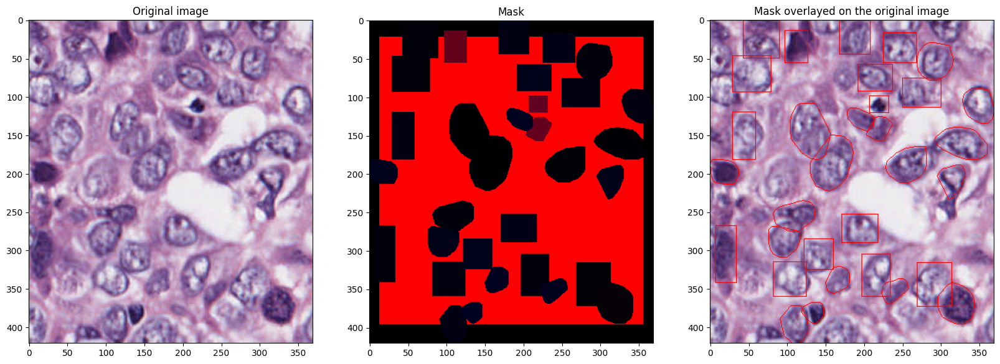

In [ ]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 3, 1)
plt.title("Original image")
plt.imshow(subject_rgb)
plt.subplot(1, 3, 2)
plt.title("Mask")
plt.imshow(subject_mask)
plt.subplot(1, 3, 3)
plt.title("Mask overlayed on the original image")
plt.imshow(masked)

## 3.2) Training and validation splits
Loop over all the image files to obtain unique subjects and then create a training and validation split, i.e., put 80% of patients in training and 20% of data in
the validation. Save training and validation splits as train subjects.csv and
validate subjects.csv files. The file organization structures should look as below: (Hint: Your training data will have approximately 100 unique subjects). [5 points]


In [ ]:
seed = 967513
train, val = train_test_split(subjects_keys, train_size=0.8, random_state=seed)


# Create a dataframe for train
slno = np.arange(0, len(train), dtype=np.int32)
fold = np.ones(len(train), dtype=np.int32)
data = {"slno": slno, "slide_name": train, "type": "train",  "fold": fold}
train_csv = pd.DataFrame(data=data)
# Create a dataframe for val
slno = np.arange(0, len(val), dtype=np.int32)
fold = np.ones(len(val), dtype=np.int32)
data = {"slno": slno, "slide_name": val, "type": "validation",  "fold": fold}
val_csv = pd.DataFrame(data=data)
# Save to csv
train_csv.to_csv(train_subjects_path)
val_csv.to_csv(val_subjects_path)

train_csv.head()

,slno,slide_name,type,fold
0,0,TCGA-EW-A1PB,train,1
1,1,TCGA-A2-A3XS,train,1
2,2,TCGA-C8-A1HJ,train,1
3,3,TCGA-S3-AA10,train,1
4,4,TCGA-OL-A5D6,train,1


# 4) Segmentation [60 points]

## 4.1) Segmentation - Unsupervised

### Step 1: Find an optimized value of K

In [ ]:
# perform K-means segmentation
# SOURCE: Tutorial 9 - K-means Segmentation (with OpenCV)
def  K_means_segmentation(subject_rgb, K):
    if(len(subject_rgb.shape)>2):
      Z = subject_rgb.reshape((-1,3)) # RGB image case
    else:
      Z = subject_rgb.reshape((-1,1)) # gray image case

    # convert to np.float32
    Z = np.float32(Z)

    # define criteria, number of clusters(K) and apply kmeans()
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

    # Now convert back into uint8, and make original image
    center = np.uint8(center)
    out = center[label.flatten()]
    out = out.reshape((subject_rgb.shape))

    label = label.reshape(subject_rgb.shape[0:2])
    return (out, label)

In [ ]:
def draw_polylines_filled(image, coordinates):
  masked = image.copy()
  for coords in coordinates:
    # For each polyline draw it on the image
    masked = cv2.fillPoly(masked, [coords], (255, 255, 255))
  return masked

In [ ]:
def to_binary_mask(subject_rgb, out, label, K):
  # look for label with lowest rgb value (darkest color = cell)
  min = 766
  min_k = -1
  for k in range(K):
    sum = np.sum(np.array(out[label==k][0]))
    if(sum < min):
      min = sum
      min_k = k

  out_black_white = np.zeros_like(subject_rgb)
  out_black_white[label== min_k] = 255
  return out_black_white

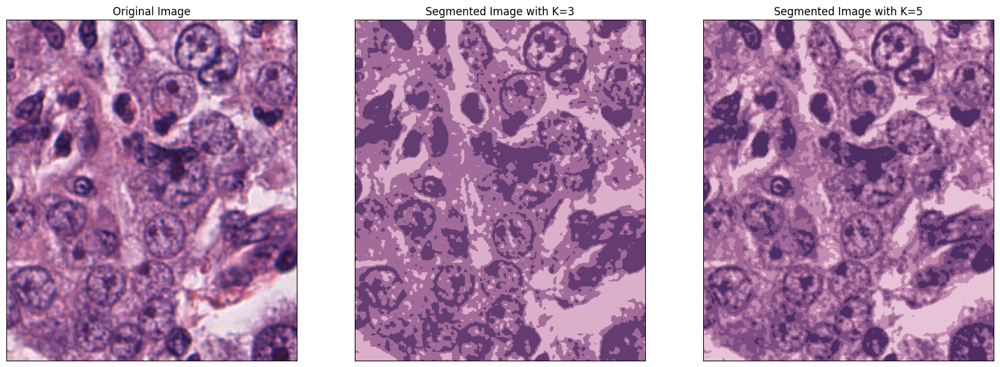

In [ ]:
# get first patient in dataframe
subject_key = train_csv.loc[0]['slide_name']
subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][0] + ".png")

# get first medical image
subject_rgb = cv2.imread(subject_rgb_path)
subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)

# perform K-means segmentation with K=3 and K=5
out_K3, label_K3 = K_means_segmentation(subject_rgb, 3)
out_K5, label_K5 = K_means_segmentation(subject_rgb, 5)


# show the results for K=3 and K=5
plt.figure(figsize=(20,20))
plt.subplot(131)
plt.imshow(subject_rgb)
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132)
plt.imshow(out_K3)
plt.title("Segmented Image with K=3"), plt.xticks([]), plt.yticks([])
plt.subplot(133)
plt.imshow(out_K5)
plt.title("Segmented Image with K=5"), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
def generate_ground_truth(subject_rgb, subject_key, img_idx):
  # generate ground truth image
  ground_truth = np.zeros_like(subject_rgb)

  # get coordinates
  subject_csv_path = os.path.join(csv_path, subjects[subject_key][img_idx] + ".csv")
  df = pd.read_csv(subject_csv_path)

  coords_x = df["coords_x"].to_list()
  coords_y = df["coords_y"].to_list()

  coordinates = get_coordinates(coords_x, coords_y)
  ground_truth = draw_polylines_filled(ground_truth, coordinates)
  ground_truth = cv2.cvtColor(ground_truth, cv2.COLOR_RGB2GRAY)
  return ground_truth


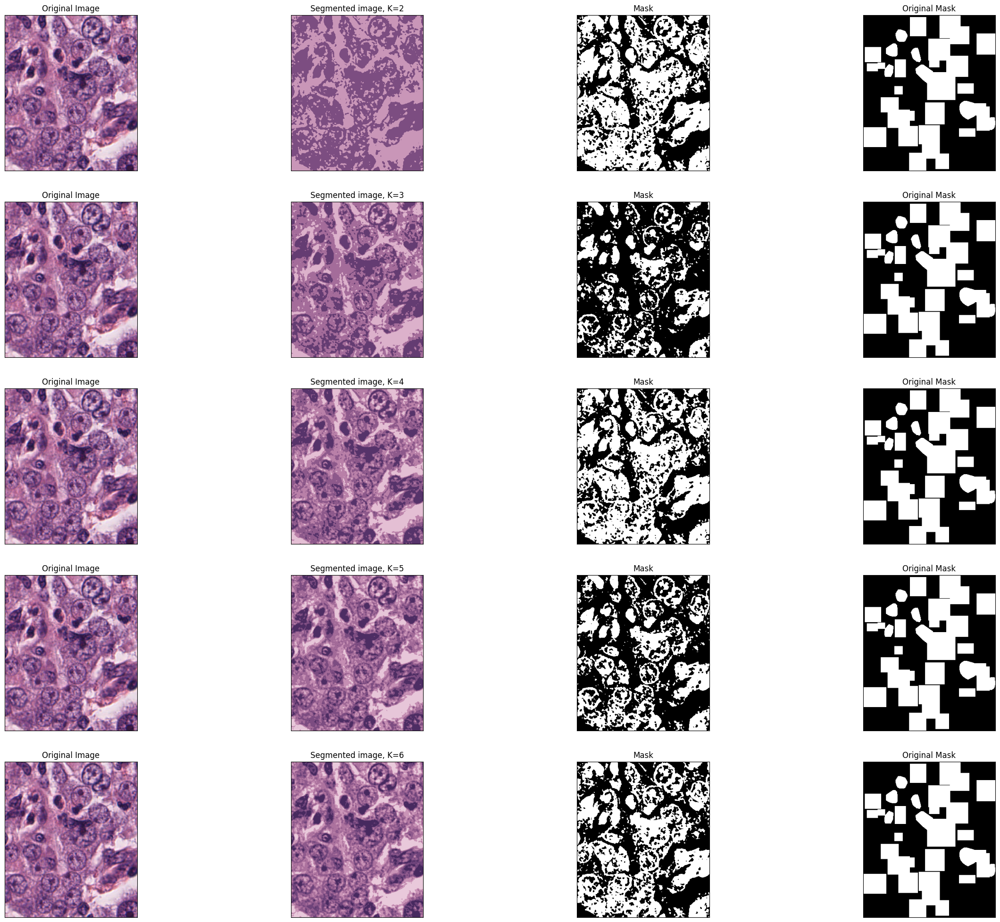

In [ ]:
row = 6
position = 1
plt.figure(figsize=(30,30))
for k in range(2,7):
  test_img_path = os.path.join(rgb_path, subjects[subject_key][0] + ".png")
  # get medical image
  test_img = cv2.imread(test_img_path)
  test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
  # generate ground truth image
  gt = generate_ground_truth(test_img, subject_key, 0)

  h, w, _ = test_img.shape
  # apply meanshift
  out, label = K_means_segmentation(test_img, k)
  #out = color.label2rgb(label, test_img, kind='avg', bg_color=(0,0,0))

  bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
  thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)

  # display
  plt.subplot(row, 4, position)
  plt.title("Original Image"), plt.xticks([]), plt.yticks([])
  plt.imshow(test_img)

  plt.subplot(row, 4, position+1)
  plt.imshow(out)
  plt.title("Segmented image, K={}".format(k)), plt.xticks([]), plt.yticks([])

  plt.subplot(row, 4, position+2)
  plt.imshow(bm, cmap="gray")
  plt.title("Mask"), plt.xticks([]), plt.yticks([])

  plt.subplot(row, 4, position+3)
  plt.imshow(gt, "gray")
  plt.title("Original Mask"), plt.xticks([]), plt.yticks([])
  position = position + 4
plt.show()

In [ ]:
# finding optimized K by computing DICE coefficients
# looking for best k in range 2 to 7

for k in range(2, 7):
  sum_dice = 0
  nb_img = 0
  # iterate over subjects in training set
  for index, row in train_csv.iterrows():
    subject_key = row['slide_name']

    # iterate over medical imgs of current subject
    for i in range(len(subjects[subject_key])):
      # get path to image
      subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][i] + ".png")
      # get image
      subject_rgb = cv2.imread(subject_rgb_path)
      subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)

      # generate ground truth image
      gt = generate_ground_truth(subject_rgb, subject_key, i)

      # perform k-means clustering
      out, label = K_means_segmentation(subject_rgb, k)
      # convert to binary mask
      #bm = to_binary_mask(subject_rgb, out, label, k)
      bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
      thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)

      # compute DICE coefficient for this image
      # SOURCE: https://stackoverflow.com/questions/31273652/how-to-calculate-dice-coefficient-for-measuring-accuracy-of-image-segmentation-i
      dice = np.sum(bm[gt==255]==255)*2.0 / (np.sum(bm[bm==255]==255) + np.sum(bm[bm==0]==0)+ np.sum(gt[gt==255]==255) + np.sum(gt[gt==0]==0))

      # update sum of DICE coefficients
      sum_dice += dice
      nb_img += 1
  avg_dice = sum_dice/nb_img
  print("Average dice coefficient for k={} is {}".format(k, avg_dice))

Average dice coefficient for k=2 is 0.1694665231493759
Average dice coefficient for k=3 is 0.1701068674563316
Average dice coefficient for k=4 is 0.16586934540127388
Average dice coefficient for k=5 is 0.16791335731685822
Average dice coefficient for k=6 is 0.17134100762867455


### Step 2: Choice of K

Based on the average dice coefficients obtained above, the best decision would be to use K=6. It results in higher dice coefficients (on average, it is 0.1712) which means the mask obtained after the K-means segmentation is the closest to the ground-truth.

### Step 3: Display original image and segmented images

In [ ]:
position = 1 # Subplot position
fig = plt.figure(figsize=(20,20))

K=6
# get first patient in dataframe
subject_key = train_csv.loc[0]['slide_name']

for i in range(3):
  subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][i] + ".png")

  # get medical image
  subject_rgb = cv2.imread(subject_rgb_path)
  subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)

  # generate ground truth image
  gt = generate_ground_truth(subject_rgb, subject_key, i)

  # perform k-means clustering
  out, label = K_means_segmentation(subject_rgb, K)
  #bm = to_binary_mask(subject_rgb, out, label, K)
  bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
  thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)

  # display original img
  plt.subplot(3, 3, position), plt.imshow(subject_rgb)
  plt.title('Original image'), plt.xticks([]), plt.yticks([])

  # Update subplot position
  position = position + 1
  # display img segmented with K-means clustering
  plt.subplot(3, 3, position), plt.imshow(bm, cmap='gray')
  plt.title('Segmented image for the optimized value of K'), plt.xticks([]), plt.yticks([])

  # Update subplot position
  position = position + 1
  # display ground-truth segmentation
  plt.subplot(3, 3, position), plt.imshow(gt, cmap='gray')
  plt.title('Ground truth segmentation'), plt.xticks([]), plt.yticks([])

  # Update subplot position
  position = position + 1

plt.show()

### Step 4: Segmentation results for grayscale images

In [ ]:
K=6
# get first patient in dataframe
subject_key = train_csv.loc[0]['slide_name']

for i in range(3):
  subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][i] + ".png")

  # get medical image
  subject_rgb = cv2.imread(subject_rgb_path)
  subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)

  # generate ground truth image
  gt = generate_ground_truth(subject_rgb, subject_key, i)

  # perform k-means clustering
  out, label = K_means_segmentation(subject_rgb, K)
  # convert to binary mask
  #bm = to_binary_mask(subject_rgb, out, label, K)
  bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
  thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)
  dice = np.sum(bm[gt==255]==255)*2.0 / (np.sum(bm[bm==255]==255) + np.sum(bm[bm==0]==0)+ np.sum(gt[gt==255]==255) + np.sum(gt[gt==0]==0))
  print("DICE coefficient for RGB image {} is {}".format(i, dice))

  subject_rgb_gray = cv2.cvtColor(subject_rgb, cv2.COLOR_RGB2GRAY)
  # generate ground truth image
  gt = generate_ground_truth(subject_rgb, subject_key, i)

  # perform k-means clustering
  out, label = K_means_segmentation(subject_rgb_gray, K)
  # convert to binary mask
  #bm = to_binary_mask(subject_rgb, out, label, K)
  bm = out
  thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)
  dice = np.sum(bm[gt==255]==255)*2.0 / (np.sum(bm[bm==255]==255) + np.sum(bm[bm==0]==0)+ np.sum(gt[gt==255]==255) + np.sum(gt[gt==0]==0))
  print("DICE coefficient for gray image {} is {}".format(i, dice))
  print('')


DICE coefficient for RGB image 0 is 0.19765987025023168
DICE coefficient for gray image 0 is 0.19950571516836577

DICE coefficient for RGB image 1 is 0.36672966247359734
DICE coefficient for gray image 1 is 0.3726045203054584

DICE coefficient for RGB image 2 is 0.16937805804320563
DICE coefficient for gray image 2 is 0.17257520357515058



As shown above, grayscale images do improve with DICE coefficients by a small amount. In all three examples, DICE coefficients for the grayscale image are slightly higher than those for the RGB images.

### Step 5: Segmentation with Quick shift


#### Implementation

In [ ]:
# get first patient in dataframe
subject_key = train_csv.loc[0]['slide_name']

In [ ]:
def to_binary_mask(subject_rgb, out, label, K):
  # look for label with lowest rgb value (darkest color = cell)
  min = 766
  min_k = -1
  for k in range(K):
    sum = np.sum(np.array(out[label==k][0]))
    if(sum < min):
      min = sum
      min_k = k

  out_black_white = np.zeros_like(subject_rgb)
  out_black_white[label== min_k] = 255
  return out_black_white

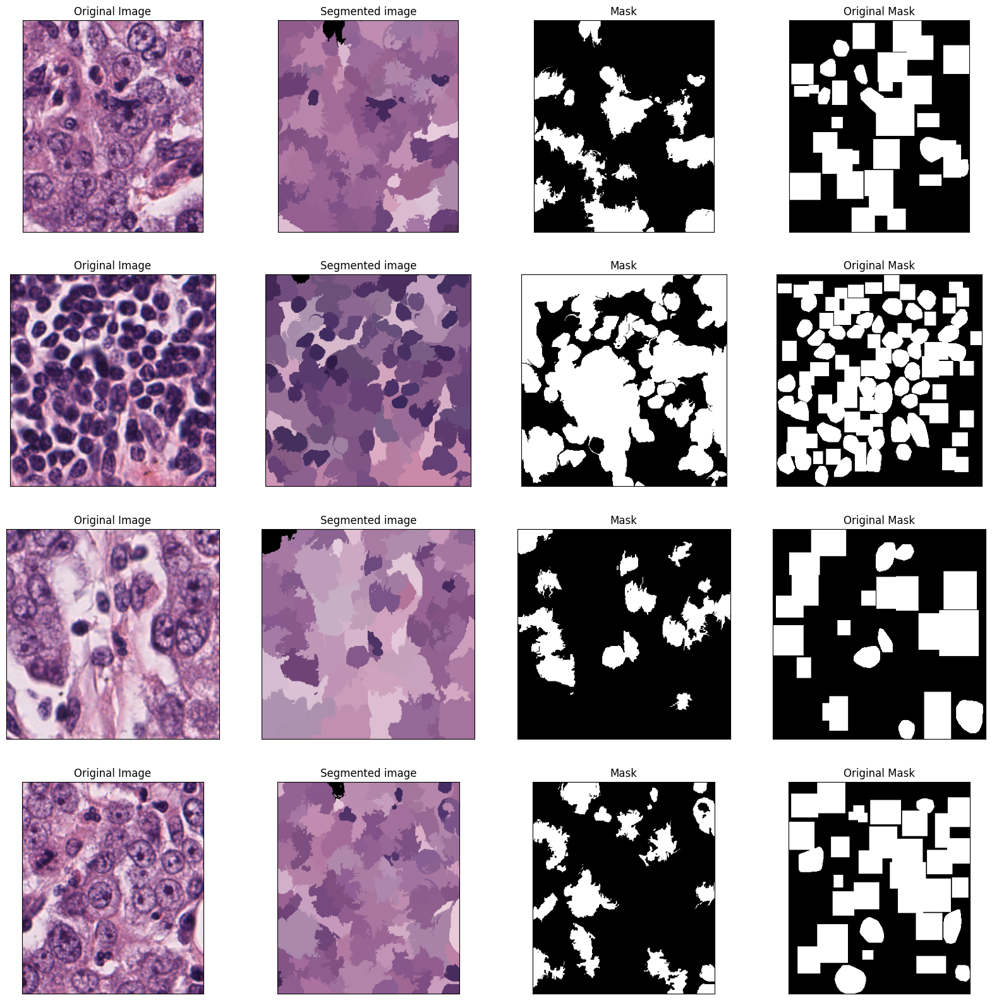

In [ ]:
row = 4
position = 1
plt.figure(figsize=(20,20))
for i in range(row):
  test_img_path = os.path.join(rgb_path, subjects[subject_key][i] + ".png")
  # get medical image
  test_img = cv2.imread(test_img_path)
  # generate ground truth image
  gt = generate_ground_truth(test_img, subject_key, i)

  h, w, _ = test_img.shape
  # apply meanshift
  test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
  label = quickshift(test_img, max_dist=100)
  out = color.label2rgb(label, test_img, kind='avg', bg_color=(0,0,0))

  bm = cv2.cvtColor(out, cv2.COLOR_RGB2GRAY)
  thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)
  #bm = cv2.adaptiveThreshold(bm,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
  #         cv2.THRESH_BINARY,11,2)

  # display
  plt.subplot(row, 4, position)
  plt.title("Original Image"), plt.xticks([]), plt.yticks([])
  plt.imshow(test_img)

  plt.subplot(row, 4, position+1)
  plt.imshow(out)
  plt.title("Segmented image"), plt.xticks([]), plt.yticks([])

  plt.subplot(row, 4, position+2)
  plt.imshow(bm, cmap="gray")
  plt.title("Mask"), plt.xticks([]), plt.yticks([])

  plt.subplot(row, 4, position+3)
  plt.imshow(gt, "gray")
  plt.title("Original Mask"), plt.xticks([]), plt.yticks([])
  position = position + 4
plt.show()

#### Comparison with K-means Segmentation

In [ ]:
parameters = [{"max_dist": 150}, {"max_dist": 100}, {"max_dist": 50}]
for param in parameters:
  # computing average DICE coefficient for Quick shift method
  sum_dice = 0
  nb_img = 0
  # iterate over subjects in training set
  for index, row in train_csv.iterrows():
    subject_key = row['slide_name']

    # iterate over medical imgs of current subject
    for i in range(len(subjects[subject_key])):
      # get path to image
      subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][i] + ".png")
      # get image
      subject_rgb = cv2.imread(subject_rgb_path)

      # generate ground truth image
      gt = generate_ground_truth(subject_rgb, subject_key, i)

      h, w, _ = subject_rgb.shape
      # apply meanshift
      label = quickshift(subject_rgb, max_dist=param["max_dist"])
      out = color.label2rgb(label, subject_rgb, kind='avg', bg_color=(0,0,0))

      bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
      thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)

      # compute DICE coefficient for this image
      # SOURCE: https://stackoverflow.com/questions/31273652/how-to-calculate-dice-coefficient-for-measuring-accuracy-of-image-segmentation-i
      dice = np.sum(bm[gt==255]==255)*2.0 / (np.sum(bm[bm==255]==255) + np.sum(bm[bm==0]==0)+ np.sum(gt[gt==255]==255) + np.sum(gt[gt==0]==0))

      # update sum of DICE coefficients
      sum_dice += dice
      nb_img += 1
  avg_dice = sum_dice/nb_img
  print(f"Average dice coefficient for Quick shift with parameters: {param} is {avg_dice}")

Average dice coefficient for Quick shift with parameters: {'max_dist': 150} is 0.12408700983269845
Average dice coefficient for Quick shift with parameters: {'max_dist': 100} is 0.12410247883357989
Average dice coefficient for Quick shift with parameters: {'max_dist': 50} is 0.13879927000016096


Quick shift has a lower DICE coefficient than the K-means method (for K=6). Moreover, as shown in segmented images, Quick shift segmentation is less precise than K-means. It tends to average features over larger segments.


## 4.2) Segmentation - Supervised

In [ ]:
# Import libraries
import cv2
import os
import numpy as np
from matplotlib import cm
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from skimage import feature, future
from sklearn.ensemble import RandomForestClassifier
from functools import partial
import pandas as pd
import glob
import random
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from scipy.stats import randint
from sklearn.svm import LinearSVC
import fnmatch
import seaborn
from seaborn import heatmap

## 4.2.1. Describe the supervised approach you are using. [4 points]

### Step: 1
#### This function reads all the csv files and extracts all the unique label.
#### This approach is taken since the CSV contain multiple hirerchey of labels (i.e. raw_classification main_classification, super_classification) changing the value of 'column_idx' will affect what category of labels are generated

In [ ]:
#This function reads all the csv files and extracts all the unique label
#This approach is taken since the CSV contain multiple hirerchey of labels (i.e. raw_classification,
# main_classification, super_classification) changing the value of 'column_idx' will affect how the labels are generated

# column index to extract unique values
column_idx = 1

# list to store unique values
unique_values = []

# loop through all CSV files in directory
for filename in os.listdir(csv_path):
    if filename.endswith(".csv"):
        filepath = os.path.join(csv_path, filename)
        df = pd.read_csv(filepath)
        column_values = df.iloc[:, column_idx].unique().tolist()
        unique_values += column_values

# get unique values
unique_values = list(set(unique_values))

#Make the 'unlabeled' an index of 0
element_to_move = 'unlabeled'
index = unique_values.index(element_to_move)
# Remove the element from its current position and insert it at the beginning of the list
unique_values.insert(0, unique_values.pop(index))

# print unique labels
print(unique_values)

#This function takes the label and returns the corresponding index
def find_index(value):
    value = str(value)
    try:
        index = unique_values.index(value)
        return index
    except ValueError:
        return None

['unlabeled', 'apoptotic_body', 'neutrophil', 'vascular_endothelium', 'macrophage', 'ductal_epithelium', 'mitotic_figure', 'plasma_cell', 'myoepithelium', 'tumor', 'eosinophil', 'fibroblast', 'lymphocyte']


### Step: 2
#### This function reads all the images one my one based on the desired percentage of training images and extracts different feautes. In total, 20 sets of features are generated for each image.
#### The image name is then used to find the csv file containing the corresponding labels and populate a list of labels for each image.

In [ ]:
percentage_of_images = 10    #Enter 100 to train on full dataset or enter the percentage of dataset
                            #This approach is takes to ensure the training can be done on machines with a lower capacity of memory

image_list = [] #Initialize the list that will hold the images
label_list = [] #Initialize the list that will hold the labels

#Just a counter to check if the total number of images read is correct or not
num_of_image_read = 0
num_of_label_read = 0

for i in range(train_csv.shape[0]):
    subject_key = train_csv.loc[i]['slide_name']
    #subject_image_files = glob.glob(f"*{subject_key}*", root_dir=rgb_path)    #Does not work on python version <= 3.10
    #a list to store the matching file names
    subject_image_files = []
    # walk through all the directories and subdirectories in the root directory
    for dirpath, dirnames, filenames in os.walk(rgb_path):
        # check each file name in the current directory for a match
        for filename in filenames:
            if fnmatch.fnmatch(filename, f"*{subject_key}*"):
                # if the filename contains the search string, add it to the list
                subject_image_files.append(os.path.join(dirpath, filename))

    random.shuffle(subject_image_files)
    selected_subject_image_files = subject_image_files[:round(len(subject_image_files)*(percentage_of_images/100))]

    for j in range(len(selected_subject_image_files)):
        subject_rgb_path = os.path.join(rgb_path, selected_subject_image_files[j])
        current_file = (os.path.splitext(os.path.basename(subject_rgb_path))[0])#Stores the basename of the current image file

        img = cv2.imread(subject_rgb_path)                                      #Read image file
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)                        #Convert image to grayscale
        flattened_image = img_gray.flatten()                                    #Reshape the image to a column

        dfLabel = pd.read_csv(csv_path+'/'+current_file+'.csv')                      #Use the image basename to find and read the corresponding CSV into a DataFrame
        total_labels = len(dfLabel.index)                                       #Load the total number of labels in the CSV
        training_labels = np.zeros(img.shape[:2], dtype=np.uint8)               #Initialize an empty array the size of the image

        for i in range (0, total_labels):                                       #Loop to read the rows of the CSV, use the min and max coordinates and fill in the labels at every pixel
            training_labels[int(dfLabel.ymin[i]):int(dfLabel.ymax[i]),
                            int(dfLabel.xmin[i]):int(dfLabel.xmax[i])] = int(find_index(dfLabel.raw_classification[i]))
        flattened_label = training_labels.reshape(-1)                           #Reshape the label to a column

        label_list.append(flattened_label)                                      #Append the reshaped label matrix into a list
        image_list.append(flattened_image)                                      #Append the reshaped image and features matrix into a list

        num_of_image_read += 1                                                  #Counter to check the total number of images read
        num_of_label_read += 1                                                  #Counter to check the total number of label read

print('Total '+str(num_of_image_read)+' images are read.')
print('Total '+str(num_of_label_read)+' labels are read.')

Total 134 images are read.
Total 134 labels are read.


### Step: 3
#### This function uses the list populated from the previous function and builds a DataFrame which can them be passed into the Classifer

In [ ]:
#Helper method to find the total number of rows for all the images combined
total_rows_image = 0
for array in image_list:
    total_rows_image += np.shape(array)[0]

#Helper method to find the total number of rows for all the labels combined
total_rows_label = 0
for array in label_list:
    total_rows_label += np.shape(array)[0]

#Check if the number of rows in all images equal to the number of rows in all lables is same or not
if total_rows_image != total_rows_label:
    assert total_rows_image == total_rows_label, "Error: Image matrix and Label is misaligned."

#Empty Matrix to generate the complete matrix where all the images and labels will be concatenated
total_matrix_image = np.zeros((total_rows_image))
total_matrix_label = np.zeros((total_rows_label))

# #It takes the image and features from the list and assigns them to a numpy array concatenating them vertically
cur_i = 0
for array in image_list:
    num_row = np.shape(array)[0]
    total_matrix_image[cur_i:num_row+cur_i] = array
    cur_i += num_row

# #It takes the ilabels from the list and assigns them to a numpy array concatenating them vertically
cur_l = 0
for array in label_list:
    num_row = np.shape(array)[0]
    total_matrix_label[cur_l:num_row+cur_l] = array
    cur_l += num_row

# # #Convert the array to a Pandas Dataframe
X = pd.DataFrame(total_matrix_image)
Y = pd.DataFrame(total_matrix_label)


### Step: 4
#### This function iterates multipletimes to find the most optimal hyperparameters
#### This code block has been commented out as the hyperparameters were already found

In [ ]:
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.ensemble import RandomForestRegressor

# n_estimators = [100, 200]
# max_features = ['sqrt']
# max_depth = [5, 10, 15]
# max_depth.append(None)
# min_samples_split = [5, 10]
# min_samples_leaf = [2, 4]
# bootstrap = [True, False]
# random_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
#                'max_depth': max_depth,
#                'min_samples_split': min_samples_split,
#                'min_samples_leaf': min_samples_leaf,
#                'bootstrap': bootstrap}

# random_forest = RandomForestRegressor()
# rf_random = RandomizedSearchCV(estimator= random_forest, param_distributions=random_grid, n_iter=10, verbose=2, random_state=42, n_jobs=-1)
# rf_random.fit(X, Y)
# print(rf_random.best_params_)

### Step: 5
#### Re-train the model with the hyperparameters from above as it has been commented out


In [ ]:
#Init the Random Forest Classifier Instance from optimal hyperparameters resulted from the previous function.
model_forrest = RandomForestClassifier(max_depth=10, n_estimators=100, random_state=42, class_weight='balanced', bootstrap=False)
model_forrest.fit(X, Y)

<ipython-input-20-bc950442973b>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model_forrest.fit(X, Y)


RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=10,
                       random_state=42)

### Step: 6
#### Read the Validation Images


In [ ]:
image_list = [] #Initialize the list that will hold the images
label_list = [] #Initialize the list that will hold the labels

#Just a counter to check the total number of images
num_of_image_read = 0
num_of_label_read = 0

for i in range(val_csv.shape[0]):
    subject_key = val_csv.loc[i]['slide_name']
    # subject_image_files = glob.glob(f"*{subject_key}*", root_dir=rgb_path)    #This approach is not availible in this version of python
    # a list to store the matching file names
    subject_image_files = []
    # walk through all the directories and subdirectories in the root directory
    for dirpath, dirnames, filenames in os.walk(rgb_path):
        # check each file name in the current directory for a match
        for filename in filenames:
            if fnmatch.fnmatch(filename, f"*{subject_key}*"):
                # if the filename contains the search string, add it to the list
                subject_image_files.append(os.path.join(dirpath, filename))

    random.shuffle(subject_image_files)
    selected_subject_image_files = subject_image_files[:2]
    for j in range(len(selected_subject_image_files)):
        subject_rgb_path = os.path.join(rgb_path, selected_subject_image_files[j])
        current_file = (os.path.splitext(os.path.basename(subject_rgb_path))[0])#Stores the basename of the current image file

        img = cv2.imread(subject_rgb_path)                                      #Read image file
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)                        #Convert image to grayscale
        flattened_image = img_gray.flatten()                                    #Reshape the image to a column

        dfLabel = pd.read_csv(csv_path+'/'+current_file+'.csv')                      #Use the image basename to find and read the corresponding CSV into a DataFrame
        total_labels = len(dfLabel.index)                                       #Load the total number of labels in the CSV
        training_labels = np.zeros(img.shape[:2], dtype=np.uint8)               #Initialize an empty array the size of the image

        for i in range (0, total_labels):                                       #Loop to read the rows of the CSV, use the min and max coordinates and fill in the labels at every pixel
            training_labels[int(dfLabel.ymin[i]):int(dfLabel.ymax[i]),
                            int(dfLabel.xmin[i]):int(dfLabel.xmax[i])] = int(find_index(dfLabel.raw_classification[i]))
        flattened_label = training_labels.reshape(-1)                           #Reshape the label to a column

        label_list.append(flattened_label)                                      #Append the reshaped label matrix into a list
        image_list.append(flattened_image)                                      #Append the reshaped image and features matrix into a list

        num_of_image_read += 1                                                  #Counter to check the total number of images read
        num_of_label_read += 1                                                  #Counter to check the total number of label read

print('Total '+str(num_of_image_read)+' images are read.')
print('Total '+str(num_of_label_read)+' labels are read.')

#Helper method to find the total number of rows for all the images combined
total_rows_image = 0
for array in image_list:
    total_rows_image += np.shape(array)[0]

#Helper method to find the total number of rows for all the labels combined
total_rows_label = 0
for array in label_list:
    total_rows_label += np.shape(array)[0]

#Check if the number of rows in all images equal to the number of rows in all lables is same or not
if total_rows_image != total_rows_label:
    assert total_rows_image == total_rows_label, "Error: Image matrix and Label is misaligned."

#Empty Matrix to generate the complete matrix where all the images and labels will be concatenated
total_matrix_image = np.zeros((total_rows_image))
total_matrix_label = np.zeros((total_rows_label))

# #It takes the image and features from the list and assigns them to a numpy array concatenating them vertically
cur_i = 0
for array in image_list:
    num_row = np.shape(array)[0]
    total_matrix_image[cur_i:num_row+cur_i] = array
    cur_i += num_row

# #It takes the ilabels from the list and assigns them to a numpy array concatenating them vertically
cur_l = 0
for array in label_list:
    num_row = np.shape(array)[0]
    total_matrix_label[cur_l:num_row+cur_l] = array
    cur_l += num_row

#Convert the array to a Pandas Dataframe
val_X = pd.DataFrame(total_matrix_image)
val_Y = pd.DataFrame(total_matrix_label)

Total 48 images are read.
Total 48 labels are read.


#### Step 7: Reporting performance on Training Images

In [ ]:
#Calculate the accuracy of Random Forest model on Training Images
prediction_forest = model_forrest.predict(X)                         #Predict on the Training Images
accuracy = metrics.accuracy_score(Y, prediction_forest)              #Calculate the accuracy
confusion  = metrics.confusion_matrix(Y, prediction_forest)          #Calculate the confusion matrix
print("Accuracy of Random Forest Classifier: "+"{:.0%}".format(accuracy) )
print(metrics.classification_report(Y, prediction_forest))

Accuracy of Random Forest Classifier: 43%


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       0.85      0.58      0.69  12555785
         1.0       0.02      0.25      0.03     23856
         3.0       0.00      0.00      0.00     34960
         4.0       0.01      0.06      0.02    163106
         5.0       0.00      0.27      0.01     12916
         6.0       0.09      0.10      0.10     23681
         7.0       0.09      0.05      0.07    519338
         8.0       0.00      0.18      0.00      1968
         9.0       0.17      0.07      0.10   2687802
        10.0       0.00      0.68      0.00      1155
        11.0       0.00      0.00      0.00    909698
        12.0       0.19      0.05      0.08    634623

    accuracy                           0.43  17568888
   macro avg       0.12      0.19      0.09  17568888
weighted avg       0.64      0.43      0.51  17568888



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 1.0, 'Confusion Matrix for Training Images')

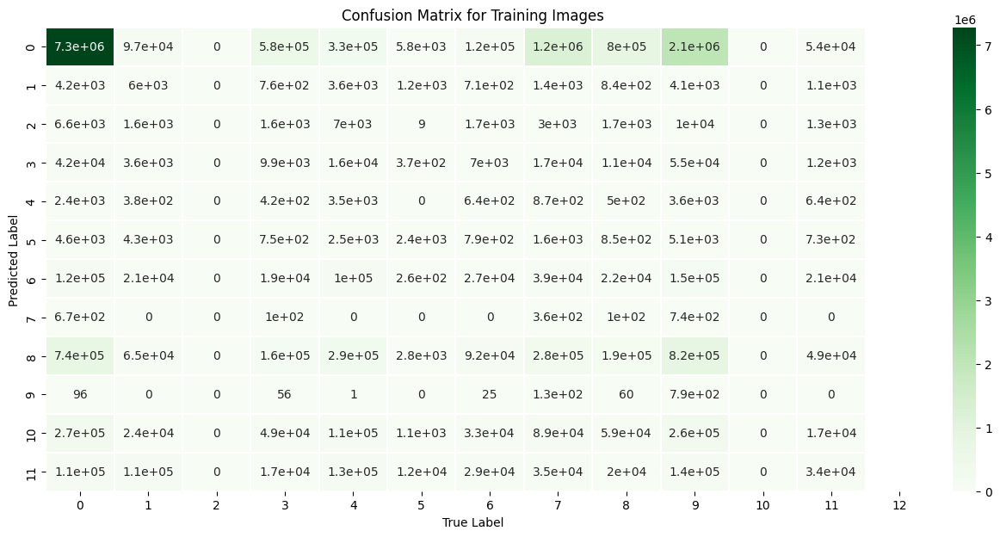

In [ ]:
# Source: https://medium.com/analytics-vidhya/evaluating-a-random-forest-model-9d165595ad56
confusion_matrix = confusion.astype('float')/confusion.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(16,7))
heatmap(confusion, annot=True, annot_kws={'size':10}, cmap=plt.cm.Greens, linewidths=0.2)
seaborn.set(font_scale=1)
tick_marks = np.arange(len(unique_values))
tick_marks2 = tick_marks+0.5
plt.xticks(tick_marks, np.arange(len(unique_values)), rotation=25)
plt.xticks(tick_marks2, np.arange(len(unique_values)), rotation=0)
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.title('Confusion Matrix for Training Images')

#### Step 8: Reporting performance on Validation Images

In [ ]:
#Calculate the accuracy of Random Forest model on Validation Images
prediction_forest = model_forrest.predict(val_X)                         #Predict on the Validation Images
accuracy = metrics.accuracy_score(val_Y, prediction_forest)              #Calculate the accuracy
confusion  = metrics.confusion_matrix(val_Y, prediction_forest)          #Calculate the confusion matrix
print(metrics.classification_report(val_Y, prediction_forest))                      #Calculate the F1 Score
print("Accuracy of Random Forest Classifier: "+"{:.0%}".format(accuracy) )

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1

              precision    recall  f1-score   support

         0.0       0.85      0.56      0.67   4621178
         1.0       0.01      0.16      0.02      8036
         3.0       0.00      0.00      0.00     36186
         4.0       0.00      0.06      0.00      4632
         5.0       0.00      0.00      0.00         0
         6.0       0.12      0.01      0.03     22384
         7.0       0.03      0.05      0.04     83060
         8.0       0.00      0.00      0.00         0
         9.0       0.22      0.07      0.11   1373610
        10.0       0.00      0.00      0.00         0
        11.0       0.00      0.00      0.00    225654
        12.0       0.16      0.06      0.09    177796

    accuracy                           0.41   6552536
   macro avg       0.12      0.08      0.08   6552536
weighted avg       0.65      0.41      0.50   6552536

Accuracy of Random Forest Classifier: 41%


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<ipython-input-25-ce568642e959>:2: RuntimeWarning: invalid value encountered in true_divide
  confusion = confusion.astype('float')/confusion.sum(axis=1)[:, np.newaxis]


Text(0.5, 1.0, 'Confusion Matrix for Validation Images')

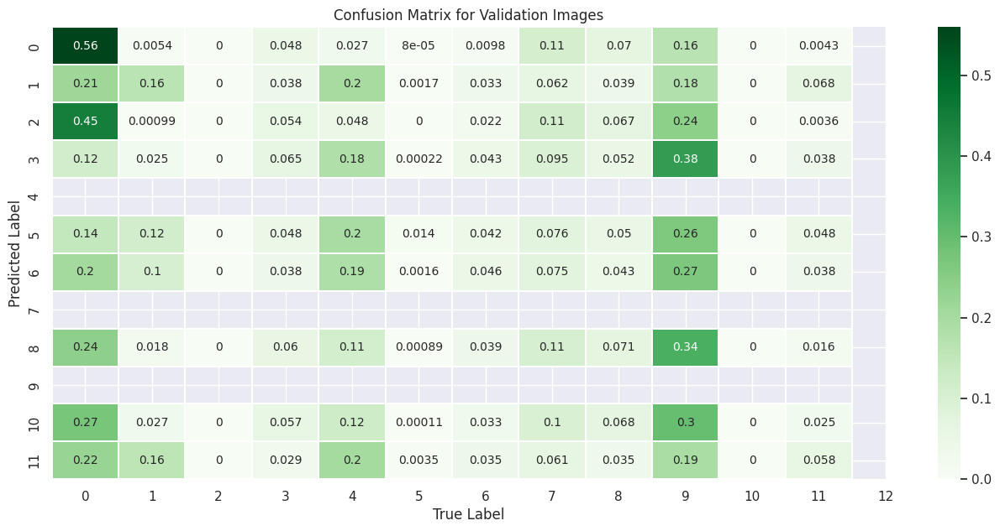

In [ ]:
# Source: https://medium.com/analytics-vidhya/evaluating-a-random-forest-model-9d165595ad56
confusion = confusion.astype('float')/confusion.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(16,7))
heatmap(confusion, annot=True, annot_kws={'size':10}, cmap=plt.cm.Greens, linewidths=0.2)
seaborn.set(font_scale=1)
tick_marks = np.arange(len(unique_values))
tick_marks2 = tick_marks+0.5
plt.xticks(tick_marks, np.arange(len(unique_values)), rotation=25)
plt.xticks(tick_marks2, np.arange(len(unique_values)), rotation=0)
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.title('Confusion Matrix for Validation Images')

#### Step 9: Displaying Results

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/Colab Notebooks/ECSE415/Project/QC"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pickle

#Save the trained model as pickle string to disk for future use
filename = "/content/drive/MyDrive/Colab Notebooks/ECSE415/Project/QC/model_forrest-finalfinallll"
model_forrest = pickle.load(open(filename, 'rb'))

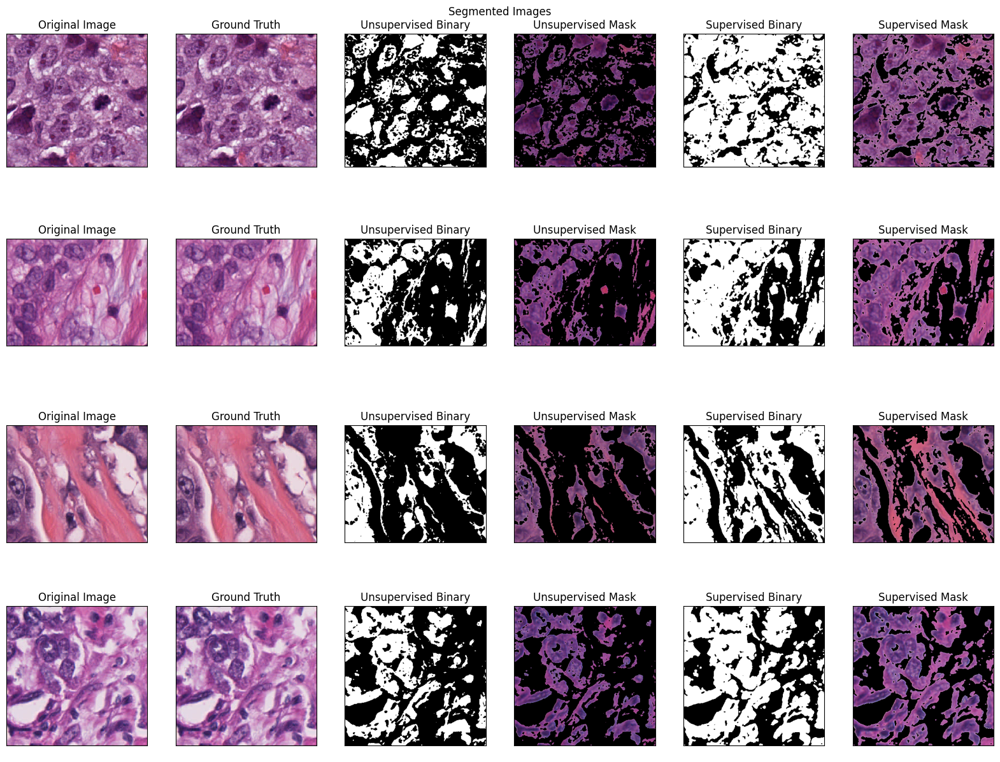

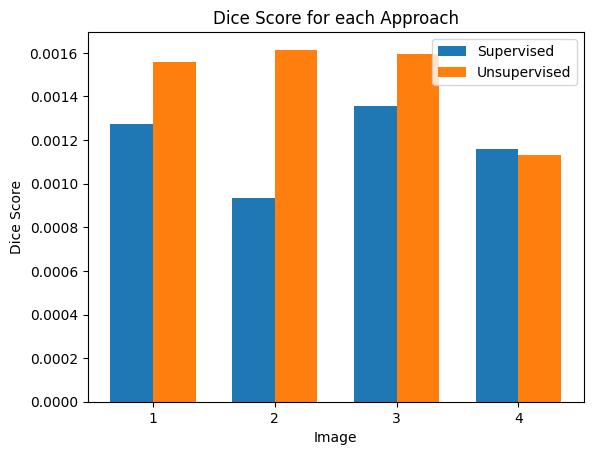

In [ ]:
# This function can be ran multiple times to show random samples.


def supervised_segmentation_forest(test_image_path):
    test_image = cv2.imread(test_image_path)
    img_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)
    flattened_image = img_gray.reshape((-1, 1))
    result = future.predict_segmenter(flattened_image, model_forrest)
    segmented = result.reshape(img_gray.shape)
    return segmented

def dice_metric(inputs, target):
    intersection = 2.0 * (target * inputs).sum()
    union = target.sum() + inputs.sum()
    if target.sum() == 0 and inputs.sum() == 0:
        return 1.0

    return intersection / union

fig = plt.figure(figsize=(20, 15))
plt.title('Segmented Images')
plt.axis('off')
row, col = 4, 6
plot_count = 1
num_of_images = 4
random_subject = random.randint(num_of_images, val_csv.shape[0])

x_axis = []
y_axis_supervised = []
y_axis_unsupervised = []
init_x = 1

for i in range(random_subject-num_of_images, random_subject):
    subject_key = val_csv.loc[i]['slide_name']
    # subject_image_files = glob.glob(f"*{subject_key}*", root_dir=rgb_path)
    # a list to store the matching file names
    subject_image_files = []
    # walk through all the directories and subdirectories in the root directory
    for dirpath, dirnames, filenames in os.walk(rgb_path):
        # check each file name in the current directory for a match
        for filename in filenames:
            if fnmatch.fnmatch(filename, f"*{subject_key}*"):
                # if the filename contains the search string, add it to the list
                subject_image_files.append(os.path.join(dirpath, filename))


    random_sample = random.randint(0, len(subject_image_files)-1)
    subject_rgb_path = os.path.join(rgb_path, subject_image_files[random_sample])
    subject_mask_path = os.path.join(mask_path, subject_image_files[random_sample])

    #Original Image
    fig.add_subplot(row, col, plot_count)
    im = cv2.imread(subject_rgb_path)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.imshow(im, interpolation='none')
    plot_count +=1
    plt.title("Original Image"), plt.xticks([]), plt.yticks([])


    #Ground Truth
    fig.add_subplot(row, col, plot_count)
    im2 = cv2.imread(subject_mask_path)
    im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)
    plt.imshow(im2, interpolation='none')
    plot_count +=1
    plt.title("Ground Truth"), plt.xticks([]), plt.yticks([])

    #Unsupervised
    test_img = cv2.imread(subject_rgb_path)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    gt = generate_ground_truth(test_img, subject_key, 0)
    h, w, _ = test_img.shape
    out, label = K_means_segmentation(test_img, 5)
    bm = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
    thresh, bm = cv2.threshold(bm, 110, 255, cv2.THRESH_BINARY_INV)

    fig.add_subplot(row, col, plot_count)
    plt.imshow(bm, cmap="gray")
    plt.title("Unsupervised Binary"), plt.xticks([]), plt.yticks([])
    plot_count +=1

    masked_image_unsupervised = cv2.bitwise_and(im, im, mask=bm)
    fig.add_subplot(row, col, plot_count)
    plt.imshow(masked_image_unsupervised, cmap="gray")
    plt.title("Unsupervised Mask"), plt.xticks([]), plt.yticks([])
    plot_count +=1

    # dice_metric(inputs, target)


    y_axis_unsupervised.append(dice_metric(bm, gt))

    #Supervised
    supervised_segmented_image = supervised_segmentation_forest(subject_rgb_path)

    blurred = cv2.GaussianBlur(supervised_segmented_image, (5,5), 0)
    (T, thresh) = cv2.threshold(blurred, 1, 255, cv2.THRESH_BINARY_INV)
    thresh = thresh.astype(np.uint8)

    y_axis_supervised.append(dice_metric(thresh, gt))
    thresh2 = thresh.astype(np.uint8)
    thresh2 = np.invert(thresh2)
    masked_image = cv2.bitwise_and(im, im, mask=thresh2)

    fig.add_subplot(row, col, plot_count)
    plt.imshow(thresh, cmap='binary')
    plot_count +=1
    plt.title("Supervised Binary"), plt.xticks([]), plt.yticks([])

    fig.add_subplot(row, col, plot_count)
    plt.imshow(masked_image)
    plot_count +=1
    plt.title("Supervised Mask"), plt.xticks([]), plt.yticks([])

    x_axis.append(init_x)
    init_x +=1

x = np.array(x_axis)
y1 = np.array(y_axis_supervised)
y2 = np.array(y_axis_unsupervised)
bar_width = 0.35

# Create the bar plot
fig, ax = plt.subplots()
ax.bar(x - bar_width/2, y1, width=bar_width, label='Supervised')
ax.bar(x + bar_width/2, y2, width=bar_width, label='Unsupervised')

# Add labels and titles
ax.set_xlabel('Image')
ax.set_ylabel('Dice Score')
ax.set_title('Dice Score for each Approach')
ax.set_xticks(x)
ax.legend()

# Show the plot
plt.show()

#### As can be seen above, both supervised and unsupervised approaches work comparably similarly to each other. Qualitatively, the unsupervised approach works better when it comes to segmenting small cluster-like nucleotides. On the other hand, the supervised approach works well for larger, even textured samples. The random forest classifier struggles quite a bit when it comes to ambiguous structures where there isn't much variation in texture and color. Quantitatively, the DICE score was calculated for each approach, and it can be seen that it varies based on the type of image. As mentioned above, the unsupervised approach outperforms the supervised method when the samples have small circular nucleotides giving a better DICE score. Conversely, the supervised approach provides a better dice score when structures are larger and more textured.

#### From the examples shown above, it can be seen that certain types of nucleotides are easier to detect and segment compared to other types using the supervised appraoch. Examples can be seen above. The above function is designed to randomly select samples from the validation dataset. Factors that might affect such behavior are as follows:
- The Random Forst Classifier struggles with details that does not have shart edges or fine structures
- The limited training sample means some classes are harder to classify
- Since the unlabelled or the background class had the most occurence, the classifier is more likely to assume an ambigious pixel is unlabelled

# 5) Detecting and Counting tumors [30 points]

## 5.1) Preparing the data

### Step 1: Grayscales

In [ ]:
# Utility function to get a subject's key and number of images
def get_subject(dataset, subject_idx):
  subject_key = dataset.loc[subject_idx]['slide_name']
  num_images = len(subjects[subject_key])
  return subject_key, num_images

# Utility function to get a patient's image
def get_subject_img(dataset, subject_key, img_idx):
  # get patient in dataset
  subject_rgb_path = os.path.join(rgb_path, subjects[subject_key][img_idx] + ".png")
  # get medical image
  subject_rgb = cv2.imread(subject_rgb_path)
  subject_rgb = cv2.cvtColor(subject_rgb, cv2.COLOR_BGR2RGB)
  subject_gray = cv2.cvtColor(subject_rgb, cv2.COLOR_RGB2GRAY)

  return subject_rgb, subject_gray

### Step 2: Regions of interest

In [ ]:
def get_patient_blobs_idx(subject_key, img_idx, label="all"):
    # get subject cvs
    subject_csv_path = os.path.join(csv_path, subjects[subject_key][img_idx] + ".csv")
    df = pd.read_csv(subject_csv_path)

    # Filter csv based on label
    if (label == "all"):
        idx = df.index[df]
    elif (label == "tumor"):
        idx = df.index[df['raw_classification'] == 'tumor']
    elif (label == "non_tumor"):
        idx = df.index[df['raw_classification'] != 'tumor']
    else:
        idx = df.index[df['raw_classification'] == label]

    return idx.tolist()

# Copy of part 4's function but with the addition of blob selection as row_index
def generate_ground_truth_blob(subject_rgb, subject_key, img_idx, blob_idx=0):
    # get subject cvs
    subject_csv_path = os.path.join(csv_path, subjects[subject_key][img_idx] + ".csv")
    df = pd.read_csv(subject_csv_path)

    coords_x = df.loc[blob_idx,["coords_x"]]
    coords_y = df.loc[blob_idx,["coords_y"]]
    coord_x = list(coords_x.values)
    coord_y = list(coords_y.values)

    coordinates = get_coordinates(coord_x, coord_y)

    # generate ground truth image
    ground_truth = np.zeros_like(subject_rgb)
    ground_truth = draw_polylines_filled(ground_truth, coordinates)
    ground_truth = cv2.cvtColor(ground_truth, cv2.COLOR_RGB2GRAY)
    return ground_truth

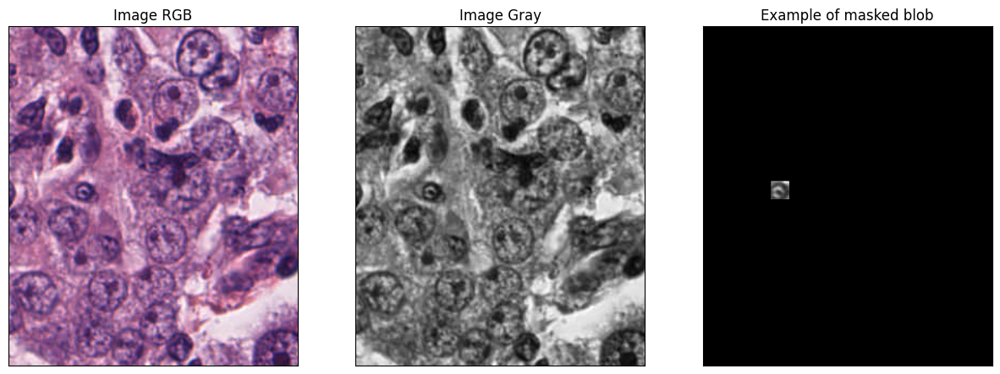

In [ ]:
# EXAMPLE: run above function and display result
subject_key, num_imgs = get_subject(train_csv, 0) # Get first patient
subject_rgb, subject_gray = get_subject_img(train_csv, subject_key, 0) # Get first image
mask = generate_ground_truth_blob(subject_rgb, subject_key, 0, 0)
subject_blob = np.where(mask > 0, subject_gray, 0)

# Display
plt.figure(figsize=(15,15))
plt.subplot(131), plt.imshow(subject_rgb, "gray")
plt.title("Image RGB"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(subject_gray, "gray")
plt.title("Image Gray"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(subject_blob, "gray")
plt.title("Example of masked blob"), plt.xticks([]), plt.yticks([])
plt.show()

### Step 4: Feature extraction

In [ ]:
classes = ["tumor", "non_tumor"] # Blob classes for classifier

# OPTION 1: Using HoG features

img_size = (100, 100)   # h x w in pixels
cell_size = (3, 3)    # h x w in pixels
block_size = (2, 2)   # h x w in cells
nbins = 8             # number of orientation bins


# create HoG Object
hog = cv2.HOGDescriptor(_winSize=(img_size[1] // cell_size[1] * cell_size[1],
                                  img_size[0] // cell_size[0] * cell_size[0]),
                        _blockSize=(block_size[1] * cell_size[1],
                                    block_size[0] * cell_size[0]),
                        _blockStride=(cell_size[1], cell_size[0]),
                        _cellSize=(cell_size[1], cell_size[0]),
                        _nbins=nbins)

In [ ]:
# Extract all blobs features of an image
def extract_image_features(subject_key, subject_rgb, subject_gray, img_idx):
    features = []
    labels = []

    # Compute features for tumors
    blobs = get_patient_blobs_idx(subject_key, img_idx, label="tumor")
    for blob in blobs:
        mask = generate_ground_truth_blob(subject_rgb, subject_key, img_idx, blob)
        img_tumors = np.where(mask > 0, subject_gray, 0)

        # HoG features
        if (0 in img_tumors.shape):
            continue
        else:
            img_tumors = cv2.resize(img_tumors, img_size, cv2.INTER_LINEAR)
            features.append(hog.compute(img_tumors))
            labels.append(classes.index("tumor"))

    # Compute features for non tumors
    blobs = get_patient_blobs_idx(subject_key, img_idx, label="non_tumor")
    for blob in blobs:
        mask = generate_ground_truth_blob(subject_rgb, subject_key, img_idx, blob)
        img_non_tumors = np.where(mask > 0, subject_gray, 0)

        # HoG features
        if (0 in img_non_tumors.shape):
            continue
        else:
            img_non_tumors = cv2.resize(img_non_tumors, img_size, cv2.INTER_LINEAR)
            features.append(hog.compute(img_non_tumors))
            labels.append(classes.index("non_tumor"))

    return features, labels

### Step 5 and 6: Detection model

In [ ]:
# Using Linear SVC which can be partially trained (to avoid RAM overflows)
from sklearn import linear_model
clf = linear_model.SGDClassifier()

### Step 7: Count of tumor instances

In [ ]:
def count_tumors(subject_key, subject_rgb, subject_gray, img_idx, clf):
    num_tumors_truth = len(get_patient_blobs_idx(subject_key, img_idx, label="tumor"))

    img_features, img_labels = extract_image_features(subject_key, subject_rgb, subject_gray, img_idx) # Extract features

    img_features = np.vstack(img_features)
    img_labels = np.array(img_labels)

    predicted = clf.predict(img_features)
    num_tumors_predicted = (predicted == classes.index("tumor")).sum() # Count predictions

    return num_tumors_predicted, num_tumors_truth

### Step 8: Features and target labels dataframe

In [ ]:
# Perform whole pipeline on all subjects
def create_dataframe(dataset, train=False, clf=None):
    features = []
    labels = []

    num_subjects = dataset.shape[0]
    for subject_idx in range(num_subjects):
        subject_key, num_imgs = get_subject(dataset, subject_idx) # Get patient key and number of images
        for img_idx in range(num_imgs):
            print("Subject {}/{}, extracting img {}/{}".format(subject_idx+1, num_subjects, img_idx+1, num_imgs))
            subject_rgb, subject_gray = get_subject_img(dataset, subject_key, img_idx) # Get images
            img_features, img_labels = extract_image_features(subject_key, subject_rgb, subject_gray, img_idx) # Extract features

            if (len(img_features) == 0):
                continue
            elif (train == True and clf != None): # Partially fit classifier and discard features in RAM after
                img_features = np.vstack(img_features)
                img_labels = np.array(img_labels)
                clf.partial_fit(img_features, img_labels, classes=np.arange(len(classes)))
            else: # Store all features and labels in RAM (might run out of RAM)
                features.append(img_features)
                labels += img_labels


    if (train == False):
        features = np.vstack(features)
        labels = np.array(labels)

    return features, labels

In [ ]:
import pickle
file_name = os.path.join(path, "classifier_saves", "svm.pkl")

# Train SVM
train = True

if (train):
  create_dataframe(train_csv, train=True, clf=clf)

  # Optionnaly save clf
  with open(file_name, 'wb') as f:
    pickle.dump(clf, f)

else:
  # Load from file
  with open(file_name, 'rb') as f:
    clf = pickle.load(f)

Subject 1/99, extracting img 1/6
Subject 1/99, extracting img 2/6
Subject 1/99, extracting img 3/6
Subject 1/99, extracting img 4/6
Subject 1/99, extracting img 5/6
Subject 1/99, extracting img 6/6
Subject 2/99, extracting img 1/34
Subject 2/99, extracting img 2/34
Subject 2/99, extracting img 3/34
Subject 2/99, extracting img 4/34
Subject 2/99, extracting img 5/34
Subject 2/99, extracting img 6/34
Subject 2/99, extracting img 7/34
Subject 2/99, extracting img 8/34
Subject 2/99, extracting img 9/34
Subject 2/99, extracting img 10/34
Subject 2/99, extracting img 11/34
Subject 2/99, extracting img 12/34
Subject 2/99, extracting img 13/34
Subject 2/99, extracting img 14/34
Subject 2/99, extracting img 15/34
Subject 2/99, extracting img 16/34
Subject 2/99, extracting img 17/34
Subject 2/99, extracting img 18/34
Subject 2/99, extracting img 19/34
Subject 2/99, extracting img 20/34
Subject 2/99, extracting img 21/34
Subject 2/99, extracting img 22/34
Subject 2/99, extracting img 23/34
Subjec

## 5.2) Classification framework

### Step 1: Performance metrics of the model

In [ ]:
# Function to validate SVM fitting and return metrics
def validate_svm(dataset, clf):
    total = 0
    correct = 0
    false_pos = 0
    false_neg = 0

    num_subjects = dataset.shape[0]
    for subject_idx in range(num_subjects):
        subject_key, num_imgs = get_subject(dataset, subject_idx) # Get patient key and number of images
        for img_idx in range(num_imgs):
            # print("Subject {}/{}, extracting img {}/{}".format(subject_idx+1, num_subjects, img_idx+1, num_imgs))
            subject_rgb, subject_gray = get_subject_img(dataset, subject_key, img_idx) # Get images
            img_features, img_labels = extract_image_features(subject_key, subject_rgb, subject_gray, img_idx) # Extract features

            img_features = np.vstack(img_features)
            img_labels = np.array(img_labels)
            predicted = clf.predict(img_features) # Predict features

            # Compute metrics
            total += img_labels.shape[0]
            correct += (predicted == img_labels).sum()
            false_pos += np.sum((img_labels == classes.index("non_tumor")) & (predicted == classes.index("tumor")))
            false_neg += np.sum((img_labels == classes.index("tumor")) & (predicted == classes.index("non_tumor")))

    return correct, total, false_pos, false_neg

In [ ]:
# Performance Metrics
correct, total, false_pos, false_neg = validate_svm(train_csv, clf)
print("Accuracy for training set: {}%".format(100 * correct / total))
print("False positives: {}%\t False negatives: {}%".format((100 * false_pos / total), (100 * false_neg / total)))

correct, total, false_pos, false_neg = validate_svm(val_csv, clf)
print("Accuracy for validation set: {}%".format(100 * correct / total))
print("False positives: {}%\t False negatives: {}%".format((100 * false_pos / total), (100 * false_neg / total)))

Accuracy for training set: 70.19426039508502%
False positives: 1.5795195798888182%	 False negatives: 28.226220025026155%
Accuracy for validation set: 62.639716840536515%
False positives: 1.732488822652757%	 False negatives: 35.62779433681073%


### Step 2: RMSE

In [ ]:
def rmse_svm(dataset, clf):
    total = 0
    predictions = []
    truth = []

    num_subjects = dataset.shape[0]
    for subject_idx in range(num_subjects):
        subject_key, num_imgs = get_subject(dataset, subject_idx) # Get patient key and number of images
        for img_idx in range(num_imgs):
            # print("Subject {}/{}, extracting img {}/{}".format(subject_idx+1, num_subjects, img_idx+1, num_imgs))
            subject_rgb, subject_gray = get_subject_img(dataset, subject_key, img_idx) # Get images
            predicted, correct = count_tumors(subject_key, subject_rgb, subject_gray, img_idx, clf)

            predictions.append(predicted)
            truth.append(correct)
            total += 1


    # Compute RMSE
    predictions = np.array(predictions, dtype=np.uint16)
    truth = np.array(truth, dtype=np.uint16)

    return truth, predictions

In [ ]:
truth, prediction = rmse_svm(val_csv, clf)
rmse = mean_squared_error(truth, prediction, squared=False)

print("RMSE for validation set: {}".format(rmse))

RMSE for validation set: 20.991377540182604


### Step 3: Performance differences with Full image training

In [ ]:
# Setup for new Classifier using full images
clf_full = linear_model.SGDClassifier()

# Override previous function to only extract full image (will be used by "extract_image_features" function from Step %.1.4)
def extract_image_features(subject_key, subject_rgb, subject_gray, img_idx):
    features = []
    labels = []

    num_tumors = len(get_patient_blobs_idx(subject_key, img_idx, label="tumor"))
    img = cv2.resize(subject_gray, img_size, cv2.INTER_LINEAR)
    features = [hog.compute(img)]
    if (num_tumors > 0):
        labels = [classes.index("tumor")]
    else:
        labels = [classes.index("non_tumor")]

    return features, labels

In [ ]:
file_name = os.path.join(path, "classifier_saves", "svm_full.pkl")

# Train SVM
train = True

if (train):
    create_dataframe(train_csv, train=True, clf=clf_full)

    # Optionnaly save clf
    with open(file_name, 'wb') as f:
        pickle.dump(clf, f)

else:
    # Load from file
    with open(file_name, 'rb') as f:
        clf = pickle.load(f)

Subject 1/99, extracting img 1/6
Subject 1/99, extracting img 2/6
Subject 1/99, extracting img 3/6
Subject 1/99, extracting img 4/6
Subject 1/99, extracting img 5/6
Subject 1/99, extracting img 6/6
Subject 2/99, extracting img 1/34
Subject 2/99, extracting img 2/34
Subject 2/99, extracting img 3/34
Subject 2/99, extracting img 4/34
Subject 2/99, extracting img 5/34
Subject 2/99, extracting img 6/34
Subject 2/99, extracting img 7/34
Subject 2/99, extracting img 8/34
Subject 2/99, extracting img 9/34
Subject 2/99, extracting img 10/34
Subject 2/99, extracting img 11/34
Subject 2/99, extracting img 12/34
Subject 2/99, extracting img 13/34
Subject 2/99, extracting img 14/34
Subject 2/99, extracting img 15/34
Subject 2/99, extracting img 16/34
Subject 2/99, extracting img 17/34
Subject 2/99, extracting img 18/34
Subject 2/99, extracting img 19/34
Subject 2/99, extracting img 20/34
Subject 2/99, extracting img 21/34
Subject 2/99, extracting img 22/34
Subject 2/99, extracting img 23/34
Subjec

In [ ]:
# Performance Metrics
correct, total, false_pos, false_neg = validate_svm(train_csv, clf_full)
print("Accuracy for training set: {}%".format(100 * correct / total))
print("False positives: {}%\t False negatives: {}%".format((100 * false_pos / total), (100 * false_neg / total)))

correct, total, false_pos, false_neg = validate_svm(val_csv, clf_full)
print("Accuracy for validation set: {}%".format(100 * correct / total))
print("False positives: {}%\t False negatives: {}%".format((100 * false_pos / total), (100 * false_neg / total)))

Accuracy for training set: 55.15818431911967%
False positives: 3.1636863823933976%	 False negatives: 41.67812929848693%
Accuracy for validation set: 42.06896551724138%
False positives: 3.4482758620689653%	 False negatives: 54.48275862068966%


### Step 4: Structures easier to segregate

In [ ]:
# Classes for classifier
classes = ["tumor", "fibroblast", "lymphocyte", "plasma_cell", "macrophage"]

# Classifier
clf_multi = linear_model.SGDClassifier()

# Utility function called by "extract_image_features" below to extract features for a class of blobs
def extract_class(subject_key, subject_rgb, subject_gray, img_idx, blob_class):
    features = []
    labels = []

    # Compute features for tumors
    blobs = get_patient_blobs_idx(subject_key, img_idx, label=blob_class)
    for blob in blobs:
        mask = generate_ground_truth_blob(subject_rgb, subject_key, img_idx, blob)
        img_masked = np.where(mask > 0, subject_gray, 0)

        # HoG features
        img_masked = cv2.resize(img_masked, img_size, cv2.INTER_LINEAR)
        features.append(hog.compute(img_masked))
        labels.append(classes.index(blob_class))

    return features, labels

# Extract all blobs features of an image
def extract_image_features(subject_key, subject_rgb, subject_gray, img_idx):
    features = []
    labels = []

    for blob_class in classes:
        # Extract all features and labels for all the blobs of a class in the image
        img_features, img_labels = extract_class(subject_key, subject_rgb, subject_gray, img_idx, blob_class)

        if (len(img_features) == 0): # skip if image does not contain any blob of selected class
            continue
        else:
            features += img_features
            labels += img_labels

    return features, labels

In [ ]:
file_name = os.path.join(path, "classifier_saves", "svm_multi.pkl")

# Train SVM
train = True

if (train):
    create_dataframe(train_csv, train=True, clf=clf_multi)

    # Optionnaly save clf
    with open(file_name, 'wb') as f:
        pickle.dump(clf, f)

else:
    # Load from file
    with open(file_name, 'rb') as f:
        clf = pickle.load(f)

Subject 1/99, extracting img 1/6
Subject 1/99, extracting img 2/6
Subject 1/99, extracting img 3/6
Subject 1/99, extracting img 4/6
Subject 1/99, extracting img 5/6
Subject 1/99, extracting img 6/6
Subject 2/99, extracting img 1/34
Subject 2/99, extracting img 2/34
Subject 2/99, extracting img 3/34
Subject 2/99, extracting img 4/34
Subject 2/99, extracting img 5/34
Subject 2/99, extracting img 6/34
Subject 2/99, extracting img 7/34
Subject 2/99, extracting img 8/34
Subject 2/99, extracting img 9/34
Subject 2/99, extracting img 10/34
Subject 2/99, extracting img 11/34
Subject 2/99, extracting img 12/34
Subject 2/99, extracting img 13/34
Subject 2/99, extracting img 14/34
Subject 2/99, extracting img 15/34
Subject 2/99, extracting img 16/34
Subject 2/99, extracting img 17/34
Subject 2/99, extracting img 18/34
Subject 2/99, extracting img 19/34
Subject 2/99, extracting img 20/34
Subject 2/99, extracting img 21/34
Subject 2/99, extracting img 22/34
Subject 2/99, extracting img 23/34
Subjec

In [ ]:
# Metrics
# Function to validate SVM fitting and return metrics per class
def validate_svm_multi(dataset, clf):
    total = np.zeros((len(classes)))
    correct = np.zeros((len(classes)))

    num_subjects = dataset.shape[0]
    for subject_idx in range(num_subjects):
        subject_key, num_imgs = get_subject(dataset, subject_idx) # Get patient key and number of images
        for img_idx in range(num_imgs):
            # print("Subject {}/{}, extracting img {}/{}".format(subject_idx+1, num_subjects, img_idx+1, num_imgs))
            subject_rgb, subject_gray = get_subject_img(dataset, subject_key, img_idx) # Get images
            img_features, img_labels = extract_image_features(subject_key, subject_rgb, subject_gray, img_idx) # Extract features

            if (len(img_features) == 0):
                continue
            else:
                img_features = np.vstack(img_features)
                img_labels = np.array(img_labels)
                predicted = clf.predict(img_features) # Predict features

                # Compute metrics
                for idx, blob_class in enumerate(classes):
                    total[idx] += np.where(img_labels == classes.index(blob_class), 1, 0).sum()
                    correct[idx] += np.where((img_labels == classes.index(blob_class)) & (predicted == classes.index(blob_class)), 1, 0).sum()

    return correct, total

In [ ]:
correct, total = validate_svm_multi(val_csv, clf_multi)

for idx, blob_class in enumerate(classes):
    print("Class: {} \t Accuracy: {}%".format(blob_class, 100 * correct[idx] / total[idx]))

Class: tumor 	 Accuracy: 19.50492780197112%
Class: fibroblast 	 Accuracy: 37.85772690106296%
Class: lymphocyte 	 Accuracy: 70.5839147998531%
Class: plasma_cell 	 Accuracy: 5.0761421319796955%
Class: macrophage 	 Accuracy: 4.615384615384615%


Question 3: Is there a difference in the performance if you use the ‘original image’ in Fig. 2 (i.e. the unmasked image (Step 1)) instead of only classifying each of the provided pathological regions (i.e. the masked regions)? Provide a qualitative and quantitative discussion of your results. (Hint: To answer this you will need to recreate Xtrain, Ytrain, Xval, and Yval. You are required to use the features from the original image for this task.):

The prediction accuracy on masked images on the training dataset was 70.61\% while for validation images, it was 63.11\%. The RMSE on the validation set was 19.24. On unmasked images, the prediction accuracy on the training dataset was 55.16\% while for validation images, it was 42.06\%. (More information in the report)

Question 4: Based on the features you used in the detection model, what pathological structures are easier to segregate from tumors? Justify your answer using appropriate metrics.

When considering other pathological structions, tumors were detected 27.97\% of the time,  fibroblast  33.44\%  of the time, lymphocyte 66.80\% of the time, plasma Cell 7.36\% of the time, and macrophage 3.84\% of the time. The lymphocyte pathology has the highest prediction accuracy. This could be explained by the fact that lymphocytes have a dark color which results in a high constrast blob in the images, making it more easily recognizable. (More information in the report)

# Bonus question

In [ ]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 KB 15.3 MB/s eta 0:00:00


In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
import cv2
import matplotlib.pyplot as plt
import torchmetrics
import torch
import numpy as np
import segmentation_models_pytorch as smp
import albumentations as albu
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
import segmentation_models_pytorch.utils

In [ ]:
DATA_DIR = path

In [ ]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, cmap="gray")
    plt.show()


In [ ]:
class Dataset(BaseDataset):
    """Read images apply preprocessing transformations.

    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing
            (e.g. noralization, shape manipulation, etc.)

    """


    def __init__(
            self,
            images_dir,
            masks_dir,
            augmentation=None,
            preprocessing=None,
            subject="TCGA-OL-A66P-DX1",
            start_idx = 0,
            end_idx = 50
    ):


        def check_subject(filename):
          return filename[:16] == self.subject

        self.subject = subject
        self.ids = os.listdir(images_dir)
        self.ids = list(filter(check_subject, self.ids))
        self.ids = self.ids[start_idx:end_idx]
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id[:-3] + "csv") for image_id in self.ids]

        self.preprocessing = preprocessing
        self.augmentation = augmentation

    def __getitem__(self, i):


        dim = (320, 320)
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        #mask = cv2.imread(self.masks_fps[i])
        #mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)


        ####################
        #  MASK FROM CSV   #
        ####################
        # generate ground truth image
        ground_truth = np.zeros_like(image)
        # get coordinates
        df = pd.read_csv(self.masks_fps[i])
        coords_x = df["coords_x"].to_list()
        coords_y = df["coords_y"].to_list()
        coordinates = get_coordinates(coords_x, coords_y)
        ground_truth = draw_polylines_filled(ground_truth, coordinates)
        ground_truth = cv2.cvtColor(ground_truth, cv2.COLOR_RGB2GRAY)#
        mask = ground_truth
        mask[mask==255] = 1
        mask = cv2.resize(mask, dim)
        mask = mask[..., np.newaxis]
        image = cv2.resize(image, dim)

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']


        # apply preprocessing
        if self.preprocessing:
            sample = self.  (image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.ids)

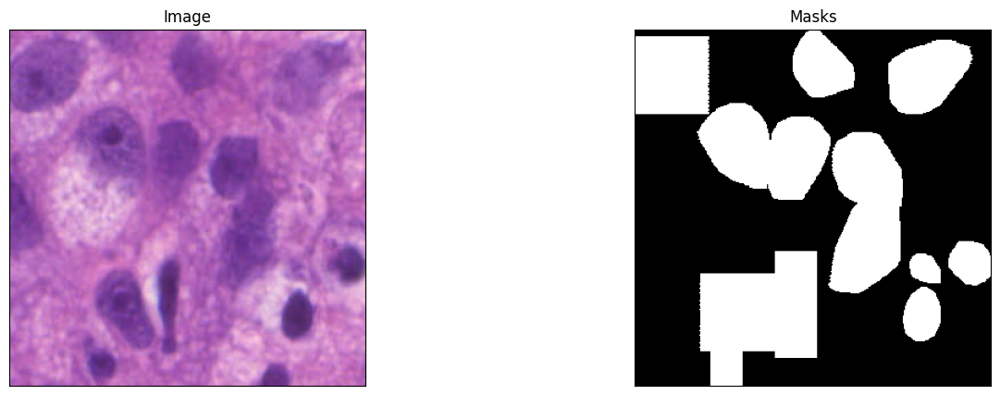

In [ ]:
# Data visualization
train_path = rgb_path #os.path.join(path, "TCGA-OL-A66P-DX1_rgb")
label_path = csv_path #os.path.join(path, "TCGA-OL-A66P-DX1_csv")

dataset = Dataset(train_path, label_path)
image, mask = dataset[2] # get some sample

visualize(
    image=image,
    masks=mask.squeeze(),
)


In [ ]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.FPN(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=1,
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [ ]:
def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

In [ ]:
train_dataset = Dataset(
    train_path,
    label_path,
    preprocessing=get_preprocessing(preprocessing_fn),
)


train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)

In [ ]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])


In [ ]:
# create epoch runners
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

In [ ]:
save_dir = "model_weights"
model_name = "unet_fine_tune.pth"
model_path = os.path.join(path, save_dir, model_name)
TRAINING = True

epochs = 100
dice_losses = np.zeros((epochs, 1))
iou_scores = np.zeros((epochs, 1))

if TRAINING:
  # train model for 100 epochs
  max_score = 0

  for i in range(0, epochs):

      print('\nEpoch: {}'.format(i))
      train_logs = train_epoch.run(train_loader)

      dice_losses[i] = train_logs['dice_loss']
      iou_scores[i] = train_logs['iou_score']


      if max_score < train_logs['iou_score']:
          max_score = train_logs['iou_score']
          torch.save(model, model_path)
          print('Model saved!')

      if i == 25:
          optimizer.param_groups[0]['lr'] = 1e-5
          print('Decrease decoder learning rate to 1e-5!')
else:
  # load best saved checkpoint
  model = torch.load(model_path)


Epoch: 0
train: 100%|██████████| 7/7 [00:22<00:00,  3.28s/it, dice_loss - 0.5809, iou_score - 0.2652]
Model saved!

Epoch: 1
train: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s, dice_loss - 0.5305, iou_score - 0.3057]
Model saved!

Epoch: 2
train: 100%|██████████| 7/7 [00:01<00:00,  4.48it/s, dice_loss - 0.4526, iou_score - 0.3812]
Model saved!

Epoch: 3
train: 100%|██████████| 7/7 [00:01<00:00,  4.55it/s, dice_loss - 0.4007, iou_score - 0.4344]
Model saved!

Epoch: 4
train: 100%|██████████| 7/7 [00:01<00:00,  4.32it/s, dice_loss - 0.3358, iou_score - 0.5067]
Model saved!

Epoch: 5
train: 100%|██████████| 7/7 [00:01<00:00,  4.43it/s, dice_loss - 0.2875, iou_score - 0.5645]
Model saved!

Epoch: 6
train: 100%|██████████| 7/7 [00:01<00:00,  4.49it/s, dice_loss - 0.2478, iou_score - 0.616]
Model saved!

Epoch: 7
train: 100%|██████████| 7/7 [00:01<00:00,  4.50it/s, dice_loss - 0.2152, iou_score - 0.6634]
Model saved!

Epoch: 8
train: 100%|██████████| 7/7 [00:01<00:00,  4.50it/s, dice_loss 

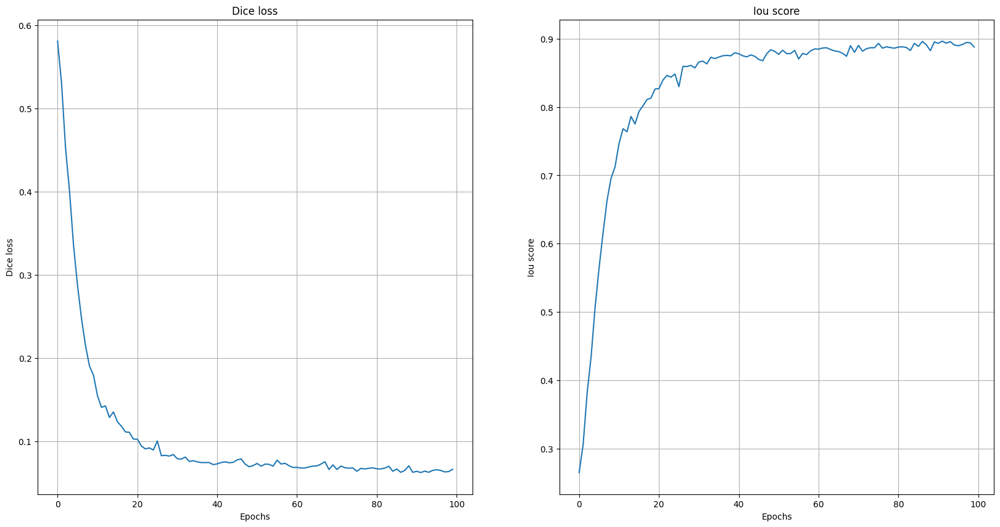

In [ ]:
# Plot Iou score and dice loss over epochs
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.grid()
plt.title("Dice loss")
plt.plot(dice_losses)
plt.xlabel("Epochs")
plt.ylabel("Dice loss")
plt.subplot(1, 2, 2)
plt.title("Iou score")
plt.grid()
plt.ylabel("Iou score")
plt.xlabel("Epochs")
plt.plot(iou_scores)

In [ ]:
# test dataset without transformations for image visualization
test_dataset_vis = Dataset(
    train_path, label_path,
    start_idx=0,
    end_idx=50
    )
# test dataset without transformations for image visualization
test_dataset = Dataset(
    train_path, label_path,
    preprocessing=get_preprocessing(preprocessing_fn),
    start_idx=50,
    end_idx=58
)

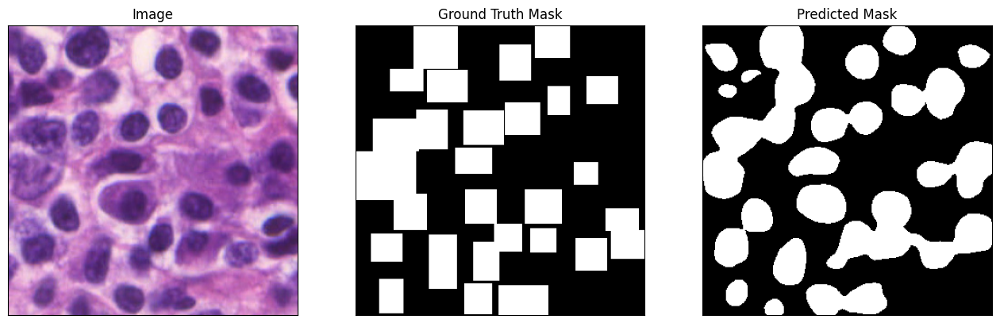

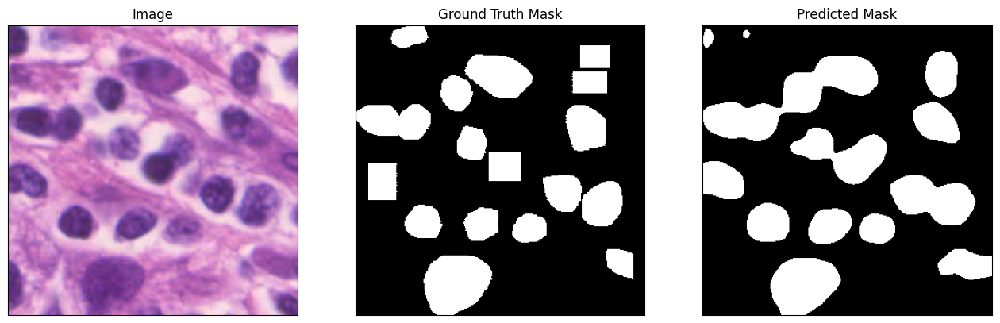

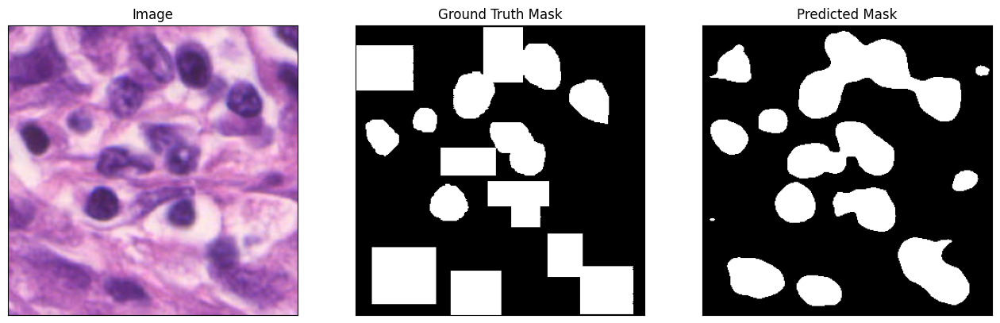

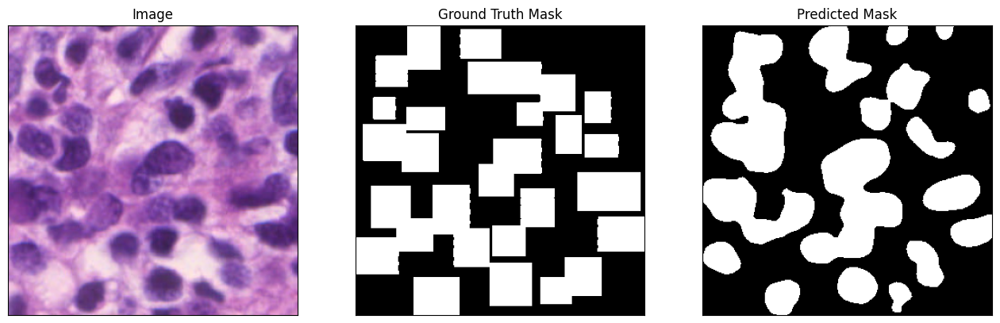

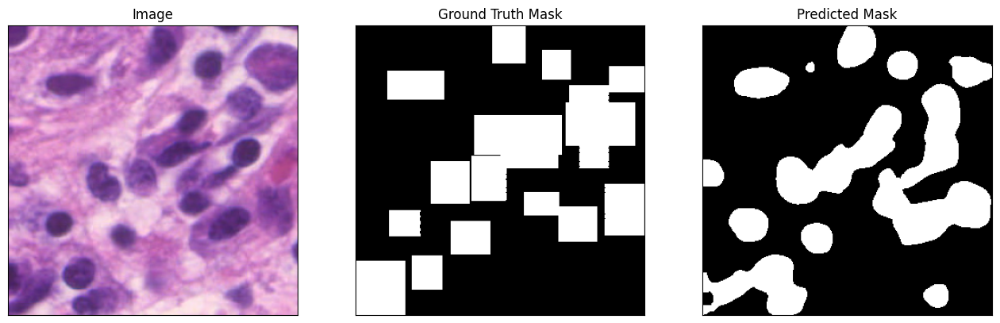

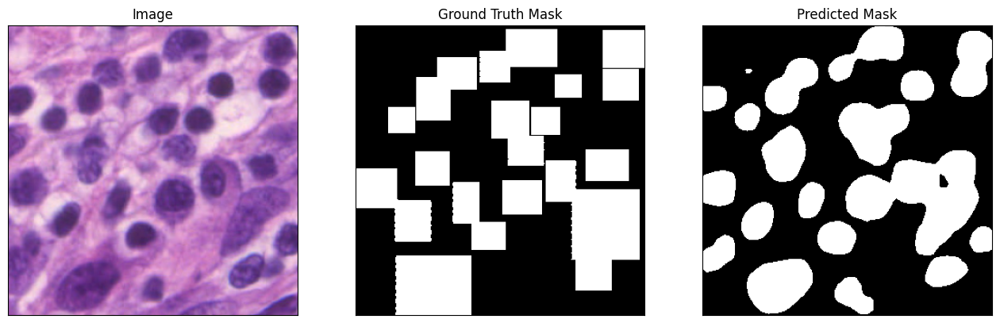

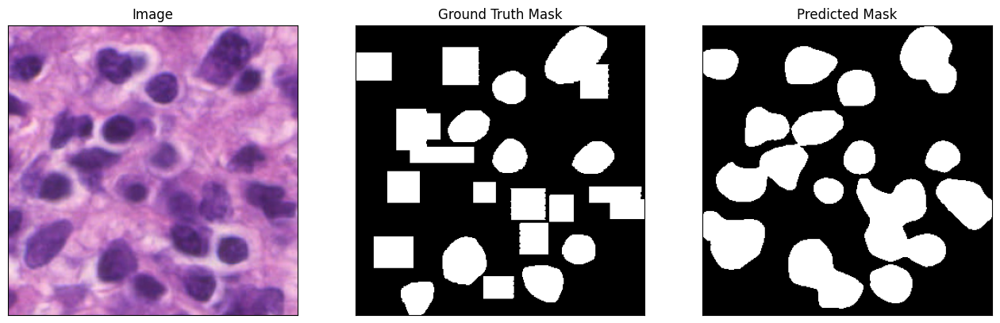

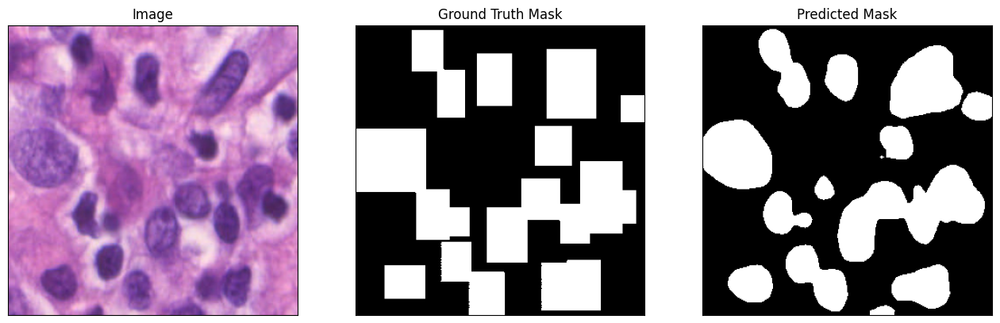

In [ ]:
_, mask = test_dataset[0]
size = (len(test_dataset), *mask.shape)
predictions = torch.zeros(size)
true_label = torch.zeros(size, dtype=int)

for i in range(len(test_dataset)):
    image_vis = test_dataset_vis[i][0].astype('uint8')
    image, gt_mask = test_dataset[i]

    true_label[i] = torch.from_numpy(gt_mask)
    gt_mask = gt_mask.squeeze()

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = model.predict(x_tensor)

    predictions[i] = pr_mask

    pr_mask = (pr_mask.squeeze().cpu().numpy().round())

    visualize(
        image=image_vis,
        ground_truth_mask=gt_mask,
        predicted_mask=pr_mask
    )

In [ ]:
tp, fp, fn, tn = smp.metrics.get_stats(predictions, true_label, mode='binary', threshold=0.5)
# Compute scores
iou_score = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")
dice = sum((2 * tp + fp + fn) / (2 * tp))
print("Iou score: ", iou_score)
print("Accuracy: ", accuracy)
print("Dice: ", accuracy)

Iou score:  tensor(0.6327)
Accuracy:  tensor(0.8487)
Dice:  tensor(0.8487)


## Implementation details
The model used is a pre trained Unet models available [here](https://smp.readthedocs.io/en/latest/index.html).
The main step made is the pre processing our images and masks since the network to be fine tuned requires specific inputs specification.
In particular the pre processing steps are:
- For the input image
  - Load the image
  - Resize to a fixed shape
  - Apply the preprocessing function provided by the model
  - Permute the axes
- For the mask image:
  - Generate the mask using the csv file
  - Normalize the mask between 0 and 1
  - Add a new axes (1 x H x W)
  - Permute the axes to (W X 1 X H)

Now that we have our dataset and our dataloader let's define our training:
- Loss function: dice loss which is equal to $1-dice$
- Optimizer: Adam
- Epochs: 100

From the result and the metrics we can see that we achieve decent results also with a limited number of training data.